In [1]:
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import umap
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import umap
from scipy import stats
import numpy as np

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/luminarian/Thinkful-Capstone-3/97f2df7261a9d688911a4b724a289f22a9ee3138/data.csv', encoding= 'unicode_escape')
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


In [35]:
df.describe(include='O')

,InvoiceNo,StockCode,Description,InvoiceDate
count,541909,541909,540455,541909
unique,25900,4070,4223,23260
top,573585,85123A,WHITE HANGING HEART T-LIGHT HOLDER,10/31/2011 14:41
freq,1114,2313,2369,1114


In [36]:
df.describe()

,Quantity,UnitPrice,CustomerID,Australia,Austria,Bahrain,Belgium,Brazil,Canada,Channel Islands,...,RSA,Saudi Arabia,Singapore,Spain,Sweden,Switzerland,USA,United Arab Emirates,United Kingdom,Unspecified
count,541909.000000,541909.000000,406829.000000,541909.000000,541909.000000,541909.000000,541909.000000,541909.000000,541909.000000,541909.000000,...,541909.000000,541909.000000,541909.000000,541909.000000,541909.000000,541909.000000,541909.000000,541909.000000,541909.000000,541909.000000
mean,9.552250,4.611114,15287.690570,0.002323,0.000740,0.000035,0.003818,0.000059,0.000279,0.001399,...,0.000107,0.000018,0.000423,0.004674,0.000853,0.003694,0.000537,0.000125,0.914320,0.000823
std,218.081158,96.759853,1713.600303,0.048144,0.027192,0.005921,0.061672,0.007684,0.016690,0.037374,...,0.010345,0.004296,0.020552,0.068208,0.029186,0.060669,0.023167,0.011201,0.279892,0.028676
min,-80995.000000,-11062.060000,12346.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.250000,13953.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,3.000000,2.080000,15152.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,10.000000,4.130000,16791.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,80995.000000,38970.000000,18287.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [3]:
countryCodes = pd.get_dummies(df['Country'])
df = pd.concat([df, countryCodes], axis=1)
df = df.drop('Country', axis=1)

In [4]:
subsample = df.sample(n=30000)

In [52]:
transactions = subsample.groupby(['InvoiceNo']).mean()
transactions['Payment'] = transactions['Quantity'] * transactions['UnitPrice']
transactions.describe()

,Quantity,UnitPrice,CustomerID,Australia,Austria,Bahrain,Belgium,Brazil,Canada,Channel Islands,...,Saudi Arabia,Singapore,Spain,Sweden,Switzerland,USA,United Arab Emirates,United Kingdom,Unspecified,Payment
count,11717.000000,11717.000000,10694.000000,11717.000000,11717.000000,11717.0,11717.000000,11717.000000,11717.000000,11717.000000,...,11717.0,11717.000000,11717.000000,11717.000000,11717.000000,11717.000000,11717.000000,11717.000000,11717.000000,11717.000000
mean,14.162910,6.062809,15264.978680,0.002390,0.000768,0.0,0.004779,0.000085,0.000256,0.001536,...,0.0,0.000427,0.005121,0.001536,0.003072,0.000427,0.000171,0.896219,0.000853,26.881032
std,66.793992,105.219112,1722.665952,0.048828,0.027705,0.0,0.068971,0.009238,0.016000,0.039166,...,0.0,0.020654,0.071379,0.039166,0.055347,0.020654,0.013064,0.304989,0.029203,139.494347
min,-3000.000000,0.000000,12347.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-6930.000000
25%,2.000000,1.350000,13824.500000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,6.682500
50%,6.000000,2.225000,15145.500000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,15.000000
75%,12.000000,3.954286,16775.750000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,25.200000
max,2400.000000,6930.000000,18287.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,...,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3380.000000


In [77]:
clean_transactions = transactions.copy()
clean_transactions['Quantity'] = clean_transactions['Quantity'][clean_transactions['Quantity'].between(clean_transactions['Quantity'].quantile(.05), clean_transactions['Quantity'].quantile(.95))]
clean_transactions['UnitPrice'] = clean_transactions['UnitPrice'][clean_transactions['UnitPrice'].between(clean_transactions['UnitPrice'].quantile(.05), clean_transactions['UnitPrice'].quantile(.95))]
clean_transactions['Payment'] = clean_transactions['Payment'][clean_transactions['Payment'].between(clean_transactions['Payment'].quantile(.05), clean_transactions['Payment'].quantile(.95))]
clean_transactions = clean_transactions.dropna(axis=0)
clean_transactions = clean_transactions.drop('CustomerID', axis=1)
clean_transactions.describe()


,Quantity,UnitPrice,Australia,Austria,Bahrain,Belgium,Brazil,Canada,Channel Islands,Cyprus,...,Saudi Arabia,Singapore,Spain,Sweden,Switzerland,USA,United Arab Emirates,United Kingdom,Unspecified,Payment
count,9053.000000,9053.000000,9053.000000,9053.000000,9053.0,9053.000000,9053.00000,9053.000000,9053.000000,9053.000000,...,9053.0,9053.000000,9053.000000,9053.000000,9053.000000,9053.000000,9053.000000,9053.000000,9053.000000,9053.000000
mean,8.899053,2.675275,0.001657,0.000994,0.0,0.005302,0.00011,0.000331,0.001546,0.000884,...,0.0,0.000221,0.005633,0.001326,0.002762,0.000331,0.000221,0.899370,0.000663,18.374458
std,7.909291,1.797318,0.040674,0.031516,0.0,0.072626,0.01051,0.018202,0.039297,0.029715,...,0.0,0.014863,0.074849,0.036386,0.052480,0.018202,0.014863,0.300854,0.025737,15.184329
min,1.000000,0.420000,0.000000,0.000000,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.750000
25%,3.000000,1.383333,0.000000,0.000000,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,7.800000
50%,6.666667,2.100000,0.000000,0.000000,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,15.225000
75%,12.000000,3.491667,0.000000,0.000000,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,22.900000
max,48.000000,8.500000,1.000000,1.000000,0.0,1.000000,1.00000,1.000000,1.000000,1.000000,...,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,90.480000


Dropping any rows with null values and clear outliers (5th quantile on low and high side)

In [87]:
scaler = StandardScaler()
scaled_transactions = scaler.fit_transform(clean_transactions)

Scaling data for PCA analysis

In [88]:
pca = PCA(n_components=2)
stock_pca = pca.fit_transform(scaled_transactions)

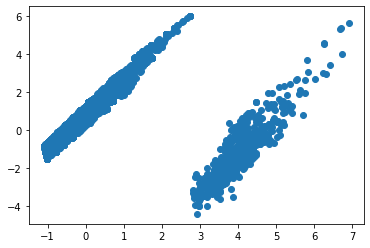

In [89]:
plt.scatter(x=stock_pca[:, 0], y=stock_pca[:, 1])
plt.show()

Looks to be two clusters on the PCA analysis

[t-SNE] Computing 451 nearest neighbors...
[t-SNE] Indexed 9053 samples in 0.161s...
[t-SNE] Computed neighbors for 9053 samples in 2.566s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9053
[t-SNE] Computed conditional probabilities for sample 2000 / 9053
[t-SNE] Computed conditional probabilities for sample 3000 / 9053
[t-SNE] Computed conditional probabilities for sample 4000 / 9053
[t-SNE] Computed conditional probabilities for sample 5000 / 9053
[t-SNE] Computed conditional probabilities for sample 6000 / 9053
[t-SNE] Computed conditional probabilities for sample 7000 / 9053
[t-SNE] Computed conditional probabilities for sample 8000 / 9053
[t-SNE] Computed conditional probabilities for sample 9000 / 9053
[t-SNE] Computed conditional probabilities for sample 9053 / 9053
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.455360
[t-SNE] KL divergence after 300 iterations: 1.088678


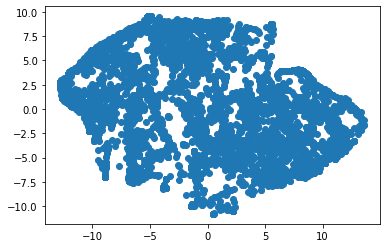

In [81]:
tsne = TSNE(n_components=2, verbose=1, perplexity=150, n_iter=300)
stock_tsne = tsne.fit_transform(clean_transactions)
plt.scatter(x=stock_tsne[:, 0], y=stock_tsne[:, 1])
plt.show()

Looks to be one mostly long connected line between transaction types using the unscaled data, so attempting to find clustering on the tsne analysis may be difficult

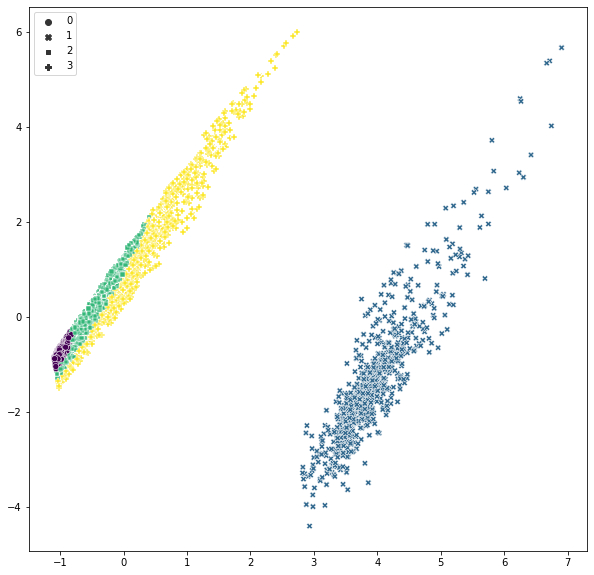

In [90]:
from sklearn.mixture import GaussianMixture

tsne_gmm_cluster = GaussianMixture(n_components=4)
clusters = tsne_gmm_cluster.fit_predict(stock_pca)

plt.figure(figsize=(10, 10))

sns.scatterplot(x=stock_pca[:, 0], y=stock_pca[:, 1], c=clusters, style=clusters)

plt.show()

Now performing analysis on a separate sample

In [91]:
subsample2 = df.sample(n=30000)


In [93]:
transactions2 = subsample2.groupby(['InvoiceNo']).mean()
transactions2['Payment'] = transactions2['Quantity'] * transactions2['UnitPrice']
transactions2

,Quantity,UnitPrice,CustomerID,Australia,Austria,Bahrain,Belgium,Brazil,Canada,Channel Islands,...,Saudi Arabia,Singapore,Spain,Sweden,Switzerland,USA,United Arab Emirates,United Kingdom,Unspecified,Payment
InvoiceNo,,,,,,,,,,,,,,,,,,,,,
536365,6.0,3.39,17850.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,20.34
536366,6.0,1.85,17850.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,11.10
536368,6.0,4.25,13047.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,25.50
536370,24.0,1.95,12583.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,46.80
536375,6.0,4.25,17850.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,25.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C580826,-31.0,1.25,17490.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,-38.75
C580966,-24.0,1.65,16554.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,-39.60
C581012,-1.0,1.25,13014.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,-1.25


In [94]:
clean_transactions2 = transactions2.copy()
clean_transactions2['Quantity'] = clean_transactions2['Quantity'][clean_transactions2['Quantity'].between(clean_transactions2['Quantity'].quantile(.05), clean_transactions2['Quantity'].quantile(.95))]
clean_transactions2['UnitPrice'] = clean_transactions2['UnitPrice'][clean_transactions2['UnitPrice'].between(clean_transactions2['UnitPrice'].quantile(.05), clean_transactions2['UnitPrice'].quantile(.95))]
clean_transactions2['Payment'] = clean_transactions2['Payment'][clean_transactions2['Payment'].between(clean_transactions2['Payment'].quantile(.05), clean_transactions2['Payment'].quantile(.95))]
clean_transactions2 = clean_transactions2.dropna(axis=0)
clean_transactions2 = clean_transactions2.drop('CustomerID', axis=1)
clean_transactions2

,Quantity,UnitPrice,Australia,Austria,Bahrain,Belgium,Brazil,Canada,Channel Islands,Cyprus,...,Saudi Arabia,Singapore,Spain,Sweden,Switzerland,USA,United Arab Emirates,United Kingdom,Unspecified,Payment
InvoiceNo,,,,,,,,,,,,,,,,,,,,,
536365,6.0,3.39,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,20.340
536366,6.0,1.85,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,11.100
536368,6.0,4.25,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,25.500
536370,24.0,1.95,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,46.800
536375,6.0,4.25,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,25.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
581572,4.0,8.50,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,34.000
581579,22.5,3.37,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,75.825
581580,2.0,0.42,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0.840


In [95]:
scaled_transactions2 = scaler.transform(clean_transactions)

In [96]:
stock_pca2 = pca.transform(scaled_transactions2)

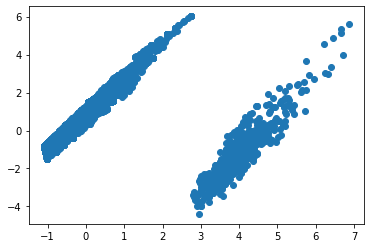

In [97]:
plt.scatter(x=stock_pca2[:, 0], y=stock_pca2[:, 1])
plt.show()

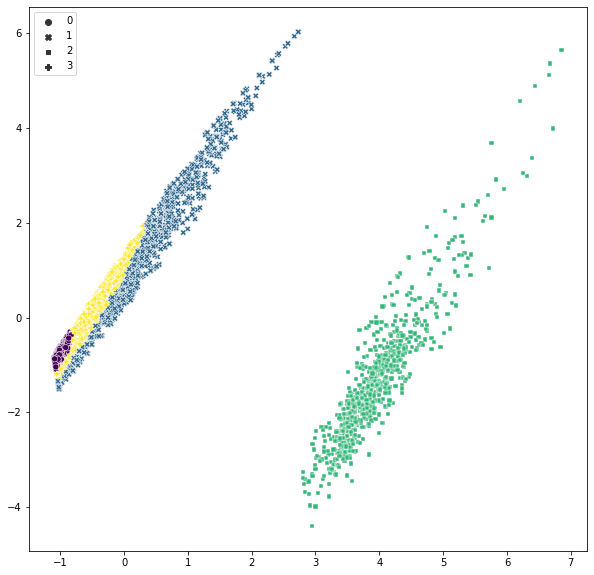

In [98]:
from sklearn.mixture import GaussianMixture

tsne_gmm_cluster = GaussianMixture(n_components=4)
clusters2 = tsne_gmm_cluster.fit_predict(stock_pca2)

plt.figure(figsize=(10, 10))

sns.scatterplot(x=stock_pca2[:, 0], y=stock_pca2[:, 1], c=clusters2, style=clusters2)

plt.show()

Very similar clustering on new data

In [99]:
it = pd.DataFrame(scaler.inverse_transform(pca.inverse_transform(stock_pca2)), columns=clean_transactions2.columns)
it['cluster'] = clusters2
aggregate = it.groupby('cluster').mean()
aggregate

,Quantity,UnitPrice,Australia,Austria,Bahrain,Belgium,Brazil,Canada,Channel Islands,Cyprus,...,Saudi Arabia,Singapore,Spain,Sweden,Switzerland,USA,United Arab Emirates,United Kingdom,Unspecified,Payment
cluster,,,,,,,,,,,,,,,,,,,,,
0,2.251061,3.016987,-0.000726,0.000266,4.319483e-19,-0.001256,-0.000222,-0.000429,-0.000145,0.000419,...,0.0,-0.000184,0.001719,0.001440,-0.003225,-0.000135,0.000036,1.015377,0.000301,7.370938
1,15.227548,2.234801,0.001230,-0.000228,-6.496409e-19,0.002322,0.000257,0.000611,0.000382,-0.000447,...,0.0,0.000189,-0.000737,-0.001460,0.004325,0.000244,-0.000031,0.968472,-0.000198,28.026078
2,11.347716,3.094250,0.015282,0.010320,9.687938e-19,0.051343,0.001037,0.002715,0.015294,0.009444,...,0.0,0.002342,0.054835,0.013945,0.024531,0.003016,0.002312,0.007436,0.006495,26.320636
3,8.529563,2.630761,0.000039,-0.000102,-1.074605e-19,-0.000147,-0.000002,0.000044,-0.000077,-0.000120,...,0.0,-0.000031,-0.000151,-0.000144,0.000148,0.000013,-0.000025,1.004802,-0.000022,17.309094


In [100]:
it.cluster.value_counts()/it.cluster.value_counts().sum()

3    0.506904
1    0.196509
0    0.195957
2    0.100630
Name: cluster, dtype: float64

In [101]:
aggregate2 = it.groupby('cluster').sum()
aggregate2['Payment']/aggregate2['Payment'].sum()

cluster
0    0.078608
1    0.299731
2    0.144148
3    0.477513
Name: Payment, dtype: float64

Division between classes is focused on spending amounts, quantities and total purchase value